In [1]:
import readfcs
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.preprocessing import normalize

Only python versions 3.7~3.10 are currently tested, use at your own risk.


In [2]:
dataV4a = readfcs.ReadFCS("./Data/v4a_concat.fcs")
dataV4b = readfcs.ReadFCS("./Data/v4b_concat.fcs")
dataV5 = readfcs.ReadFCS("./Data/v5_concat.fcs")

dataAnn = readfcs.read("./Data/v4a_concat.fcs")

featNames =  np.unique( [feat.split("_")[1]  for feat in pd.read_csv("./Data/Alkahest-V4a.csv",index_col=0).columns])
featNames = featNames[featNames != "Frequency"]

In [5]:
featNames

array(['CREB', 'ERK', 'IkB', 'MAPKAPK2', 'NFkB', 'S6', 'STAT1', 'STAT3',
       'STAT5', 'p38', 'pSTAT6'], dtype='<U9')

In [6]:
nameDict = {}
for name in dataAnn.var.index[2:-9]:
    nameDict[name[:3]] = name[6:]

np.random.seed(123123123)
selectionV4a = np.random.choice(dataV4a.data.shape[0],200000)
selectionV4b = np.random.choice(dataV4b.data.shape[0],200000)
selectionV5 = np.random.choice(dataV5.data.shape[0],200000)


dataV4aFilt = dataV4a.data.iloc[selectionV4a ,[ (v[6:] in featNames) or v[:2] == "t-" for v in dataAnn.var.index] ]
dataV4bFilt = dataV4b.data.iloc[selectionV4b ,[ (v[6:] in featNames) or v[:2] == "t-" for v in dataAnn.var.index] ]
dataV5Filt =  dataV5.data.iloc[selectionV5 ,[ (v[6:] in featNames) or v[:2] == "t-" for v in dataAnn.var.index] ]

dataV4aFilt.columns = [ nameDict[v[2:5]] for v in dataV4aFilt.columns[:-2]] + ['t-SNE 1', 't-SNE 2']
dataV4bFilt.columns = dataV4aFilt.columns
dataV5Filt.columns = dataV4aFilt.columns

data = pd.concat([dataV4aFilt,dataV4bFilt,dataV5Filt])



In [8]:
dataV4a.data.columns


Index(['Time', 'Event_length', 'Pd102Di', 'Pd104Di', 'Pd105Di', 'Pd106Di',
       'Pd108Di', 'Pd110Di', 'In113Di', 'In115Di', 'La139Di', 'Ce140Di',
       'Pr141Di', 'Nd142Di', 'Nd143Di', 'Nd144Di', 'Nd145Di', 'Nd146Di',
       'Sm147Di', 'Nd148Di', 'Sm149Di', 'Nd150Di', 'Eu151Di', 'Sm152Di',
       'Eu153Di', 'Sm154Di', 'Gd155Di', 'Gd156Di', 'Gd157Di', 'Gd158Di',
       'Tb159Di', 'Gd160Di', 'Dy161Di', 'Dy162Di', 'Dy163Di', 'Dy164Di',
       'Ho165Di', 'Er166Di', 'Er167Di', 'Er168Di', 'Tm169Di', 'Er170Di',
       'Yb171Di', 'Yb172Di', 'Yb173Di', 'Yb174Di', 'Lu175Di', 'Lu176Di',
       'Ir191Di', 'Ir193Di', 'Center', 'Offset', 'Width', 'Residual',
       'beadDist', 't-SNE 1', 't-SNE 2', 'SOM 1 cluster ID', 'SOM 1 distance'],
      dtype='object')

In [95]:
datasetNames = ["V4a","V4b","V5"]
# featureIdx from 0 to 10
# timePointIdx from 0 to 2
col = 'plasma'
scale = 15
func = lambda x : np.tanh(x/scale)
# sm = plt.cm.ScalarMappable(cmap=col)

def displayTSNE(featureIdx, timePointIdx,transform=False):
    plt.figure(figsize=(10,8))
    for idx,dataset in zip(range(3),[dataV4aFilt,dataV4bFilt,dataV5Filt]):
        if idx == timePointIdx:
            feat = dataset.loc[:,featNames[featureIdx]]
            if transform: 
                feat = func(feat)
                mi,ma = np.min(func(data.loc[:,featNames[featureIdx]])),np.max(func(data.loc[:,featNames[featureIdx]]))
            else:
                mi,ma = np.min(data.loc[:,featNames[featureIdx]]),np.max(data.loc[:,featNames[featureIdx]])
            plt.scatter(dataset.iloc[:,-1],dataset.iloc[:,-2],s = 0.2, c = feat,zorder =2,vmin=mi, vmax=ma)
        else:
            plt.scatter(dataset.iloc[:,-1],dataset.iloc[:,-2],s=0.2, c = "gray",zorder =1)
    if transform:
        plt.title(featNames[featureIdx] + " on " + datasetNames[timePointIdx] + " (tanh transform)")
    else:
        plt.title(featNames[featureIdx] + " on " + datasetNames[timePointIdx])
    plt.clim(vmin=mi, vmax=ma)
    plt.colorbar()
    plt.set_cmap(col)
    plt.show()

def subDisplayTSNE(ax,featureIdx, timePointIdx, transform=False):
    for idx,dataset in zip(range(3),[dataV4aFilt,dataV4bFilt,dataV5Filt]):
        if idx == timePointIdx:
            feat = dataset.loc[:,featNames[featureIdx]]
            if transform: 
                feat = func(feat)
                mi,ma = np.min(func(data.loc[:,featNames[featureIdx]])),np.max(func(data.loc[:,featNames[featureIdx]]))
            else:
                mi,ma = np.min(data.loc[:,featNames[featureIdx]]),np.max(data.loc[:,featNames[featureIdx]])
            sc = ax.scatter(dataset.iloc[:,-1],dataset.iloc[:,-2],s = 0.2, c = feat,zorder =2,cmap=col,vmin=mi, vmax=ma)
            # ax.set_clim(sc,vmin=mi, vmax=ma)
            plt.colorbar(sc, ax=ax)
        else:
            ax.scatter(dataset.iloc[:,-1],dataset.iloc[:,-2],s=0.2, c = "gray",zorder =1)
    if transform:
        ax.set_title(featNames[featureIdx] + " on " + datasetNames[timePointIdx] + " (tanh transform)")
    else:
        ax.set_title(featNames[featureIdx] + " on " + datasetNames[timePointIdx])




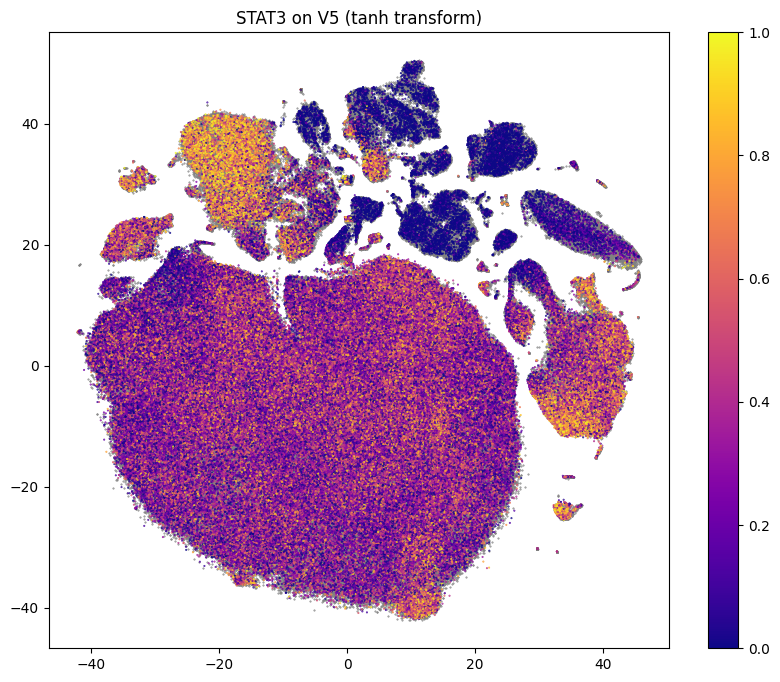

In [96]:
displayTSNE(7,2,True)

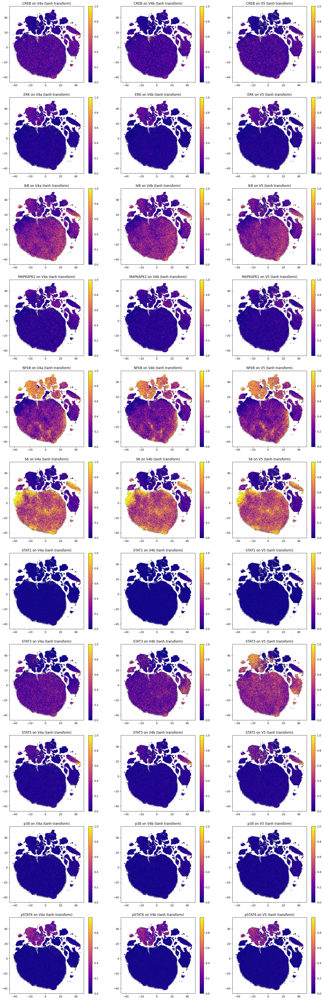

In [97]:
fig,ax = plt.subplots(11,3,figsize=(21,66))
for i in range(11):
    for j in range(3):
        subDisplayTSNE(ax[i,j],i,j,True)

plt.set_cmap(col)
plt.show()